<h1>Distracted Driver Detection System</h1>

<h3>IMPORTING LIBRARIES</h3>

In [88]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import itertools
import pandas as pd
import glob
import pickle
import os
import time
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.svm import SVC
import joblib
from tqdm import tqdm

<h3>LOADING DATASET</h3>

In [89]:
DATA_DIR = os.path.join('dataset', 'imgs', 'train')

class_labels = []
images = []

for class_index in range(10):
    class_path = os.path.join(DATA_DIR, 'c' + str(class_index))
    print(f"Processing class directory: {class_path}")  # DEBUG: Print the path

    if not os.path.exists(class_path):
        print(f"Warning: Class directory NOT FOUND: {class_path}")
        continue  # Skip to the next class

    for root, dirs, files in os.walk(class_path):
        for filename in tqdm(files, desc=f'Processing class {class_index}'):
            image_path = os.path.join(root, filename)  # Correct way to join path and filename
            # print(f"Checking file: {image_path}") #Check file path
            if not os.path.exists(image_path):
                print(f"File NOT FOUND: {image_path}")
                continue

            img = cv2.imread(image_path)
            if img is None:
                print(f"Could NOT READ image: {image_path}")
                continue

            img = cv2.resize(img, (100, 100)) / 255.0  # Normalize (important!)
            images.append(img)
            class_labels.append(class_index)

# CRITICAL: Check if ANY images were loaded
if not images:
    print("ERROR: NO IMAGES WERE LOADED. CHECK YOUR PATHS AND DATASET STRUCTURE!!!")
    print(f"Data Directory being used is : {DATA_DIR}")
else:
    images = np.array(images)
    class_labels = np.array(class_labels)

    print(f"Number of images loaded: {len(images)}")
    print(f"Images shape: {images.shape}")
    print(f"Labels shape: {class_labels.shape}")

Processing class directory: dataset\imgs\train\c0


Processing class 0: 100%|██████████| 2489/2489 [00:54<00:00, 45.98it/s]


Processing class directory: dataset\imgs\train\c1


Processing class 1: 100%|██████████| 2267/2267 [01:10<00:00, 32.32it/s]


Processing class directory: dataset\imgs\train\c2


Processing class 2: 100%|██████████| 2317/2317 [01:13<00:00, 31.34it/s]


Processing class directory: dataset\imgs\train\c3


Processing class 3: 100%|██████████| 2346/2346 [01:14<00:00, 31.55it/s]


Processing class directory: dataset\imgs\train\c4


Processing class 4: 100%|██████████| 2326/2326 [01:14<00:00, 31.20it/s]


Processing class directory: dataset\imgs\train\c5


Processing class 5: 100%|██████████| 2312/2312 [00:54<00:00, 42.10it/s]


Processing class directory: dataset\imgs\train\c6


Processing class 6: 100%|██████████| 2325/2325 [00:45<00:00, 50.66it/s]


Processing class directory: dataset\imgs\train\c7


Processing class 7: 100%|██████████| 2002/2002 [00:40<00:00, 49.17it/s]


Processing class directory: dataset\imgs\train\c8


Processing class 8: 100%|██████████| 1911/1911 [00:34<00:00, 56.19it/s]


Processing class directory: dataset\imgs\train\c9


Processing class 9: 100%|██████████| 2129/2129 [00:34<00:00, 61.84it/s]


Number of images loaded: 22424
Images shape: (22424, 100, 100, 3)
Labels shape: (22424,)


<h3>TRAIN TEST SPLIT</h3>

In [90]:
train_images, test_images, train_labels, test_labels = train_test_split(np.array(images), np.array(class_labels), test_size = 0.2, shuffle=True)

<h3>FEATURE EXTRACTION USING CNN</h3>

In [91]:
# Define the custom CNN architecture
cnn = Sequential()
cnn.add(Conv2D(32, (3, 3), activation='relu', input_shape=(100, 100, 3)))
cnn.add(MaxPooling2D((2, 2)))
cnn.add(Conv2D(64, (3, 3), activation='relu'))
cnn.add(MaxPooling2D((2, 2)))
cnn.add(Conv2D(128, (3, 3), activation='relu'))
cnn.add(MaxPooling2D((2, 2)))
cnn.add(Flatten())
cnn.add(Dense(256, activation='relu'))
cnn.add(Dense(128, activation='relu'))
cnn.add(Dense(10, activation='softmax'))

# Compile the model
cnn.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [92]:
cnn.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 98, 98, 32)        896       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 49, 49, 32)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 47, 47, 64)        18496     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 23, 23, 64)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 21, 21, 128)       73856     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 10, 10, 128)     

<h3>ONE HOT ENCODING</h3>

In [93]:
# Encode the target labels as one-hot vectors
train_labels_encoded = to_categorical(train_labels, num_classes=10)
test_labels_encoded = to_categorical(test_labels, num_classes=10)

cnn.fit(train_images, train_labels_encoded, epochs=1, batch_size=32, validation_data=(test_images, test_labels_encoded))

561/561 [==============================] - 121s 212ms/step - loss: 0.5892 - accuracy: 0.8013 - val_loss: 0.1160 - val_accuracy: 0.9683


**REMOVING THE FINAL FULLY CONNECTED LAYER TO GET THE 128 FEATURES EXTRACTED FROM PREVIOUS LAYER**

In [94]:
# Remove the last layer from the CNN model
cnn = Sequential(cnn.layers[:-1])

# Preventing the weights from being updated
for layer in cnn.layers:
    layer.trainable = False

In [95]:
cnn.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 98, 98, 32)        896       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 49, 49, 32)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 47, 47, 64)        18496     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 23, 23, 64)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 21, 21, 128)       73856     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 10, 10, 128)     

<h3>EXTRACTED FEATURES</h3>

In [96]:
train_features = cnn.predict(train_images)
test_features = cnn.predict(test_images)

141/141 [==============================] - 13s 83ms/step


In [97]:
print(train_features.shape)
print(test_features.shape)

(17939, 128)
(4485, 128)


<h3>FEATURE REDUCTION USING PCA</h3>
<h5>Here, we will reduce the extracted features(128) to 16 features using Principal Component Analysis</h5>

<h3>PCA IMPLEMENTATION</h3>

<h3>APPLYING PCA</h3>

In [98]:
from sklearn.decomposition import PCA

pca = PCA(n_components=16)
train_features_reduced = pca.fit_transform(train_features)
test_features_reduced = pca.transform(test_features)

In [99]:
print(train_features_reduced.shape)
print(test_features_reduced.shape)

(17939, 16)
(4485, 16)


<h3>SAVING THE REDUCED FEATURES</h3>

In [100]:
train_features_reduced_save = pd.DataFrame(train_features_reduced)
train_features_reduced_save.to_csv('train_features_reduced_save.csv', index=False)

In [101]:
test_features_reduced_save = pd.DataFrame(test_features_reduced)
test_features_reduced_save.to_csv('test_features_reduced_save.csv', index=False)

In [102]:
train_tar_save = pd.DataFrame(train_labels)
train_tar_save.to_csv('train_tar.csv', index=False)

In [103]:
test_tar_save = pd.DataFrame(test_labels)
test_tar_save.to_csv('test_tar.csv', index=False)

In [104]:
print(train_features_reduced[0])

[10.73 -1.52  7.2  -3.59  1.84 -2.74 -3.52  1.66  1.33  4.2   2.    0.73
 -1.02  0.38  2.55 -2.26]


In [105]:
print(test_features_reduced[0])

[-1.83  6.72  5.45 -1.64  8.84  6.13 -2.6  -6.01  1.49 -3.36  2.03  1.06
  0.15  0.52 -0.65 -0.64]


<h2>CLASSIFICATION</h2>

<H3>1. SUPPORT VECTOR MACHINE (SVM)</H3>

<H3>SVM WITH PCA</H3>

In [106]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

# Create an SVM classifier with a linear kernel
svm = SVC(kernel='linear', C=1, max_iter=100, random_state=0, verbose=0)

start_time = time.time()
svm.fit(train_features_reduced, train_labels)
end_time = time.time()

training_duration = end_time - start_time
print("Training duration:", training_duration, "seconds")

predictions = svm.predict(test_features_reduced)
accuracy = np.mean(predictions == test_labels)
print("Accuracy:", accuracy)

Training duration: 0.40474867820739746 seconds
Accuracy: 0.9366778149386845


C:\Users\yoyod\AppData\Roaming\Python\Python311\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


<H3>SVM WITHOUT PCA</H3>

In [107]:
svm_no_pca = SVC(kernel='linear', C=1, max_iter=100, random_state=0, verbose=0)

start_time_no_pca = time.time()
svm_no_pca.fit(train_features, train_labels)
end_time_no_pca = time.time()

training_duration_no_pca = end_time_no_pca - start_time_no_pca
print("Training duration without PCA:", training_duration_no_pca, "seconds")

predictions_no_pca = svm_no_pca.predict(test_features)
accuracy_no_pca = np.mean(predictions_no_pca == test_labels)
print("Accuracy without PCA:", accuracy_no_pca)

C:\Users\yoyod\AppData\Roaming\Python\Python311\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Training duration without PCA: 1.4425687789916992 seconds
Accuracy without PCA: 0.9774804905239688


<H3>SVM MODEL EVALUATION</H3>

<H3>1. CONFUSION MATRIX</H3>

In [108]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix')

    #print(cm)
    plt.figure(figsize = (10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

Confusion matrix


<Figure size 640x480 with 0 Axes>

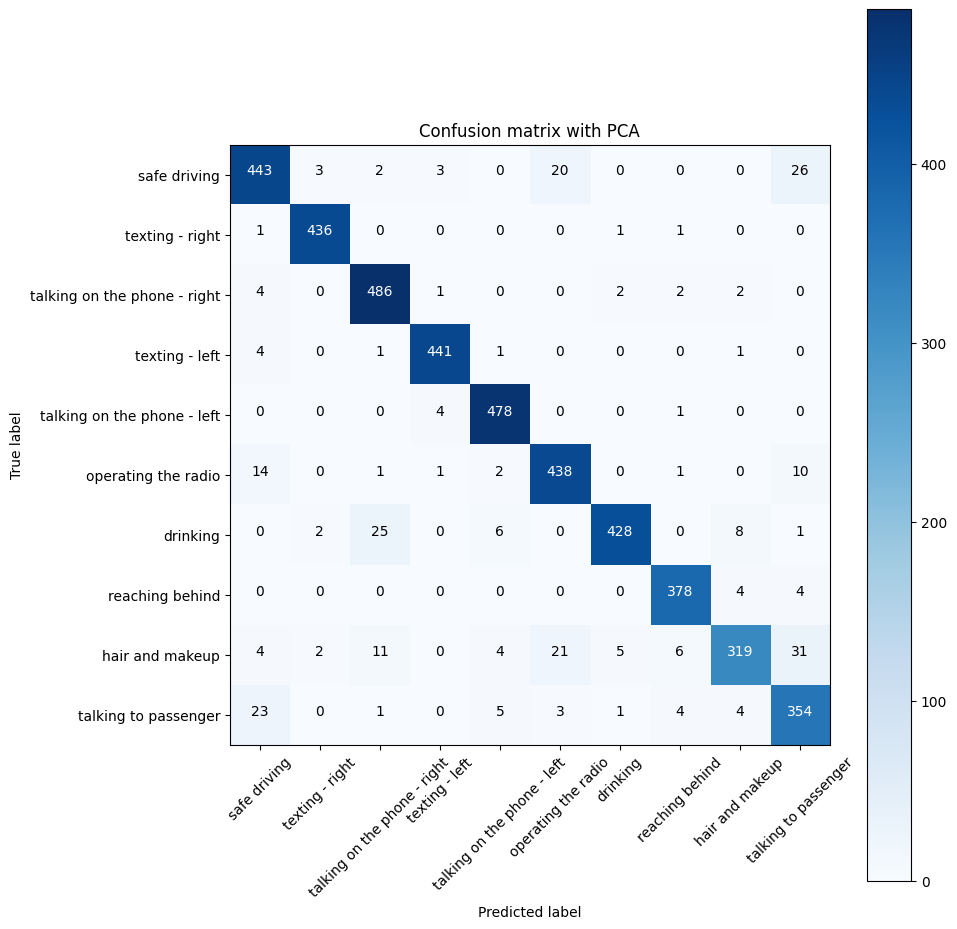

In [109]:
from sklearn.metrics import confusion_matrix
# Compute confusion matrix
cnf_matrix = confusion_matrix(test_labels, predictions)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']

plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix with PCA')

Confusion matrix


<Figure size 640x480 with 0 Axes>

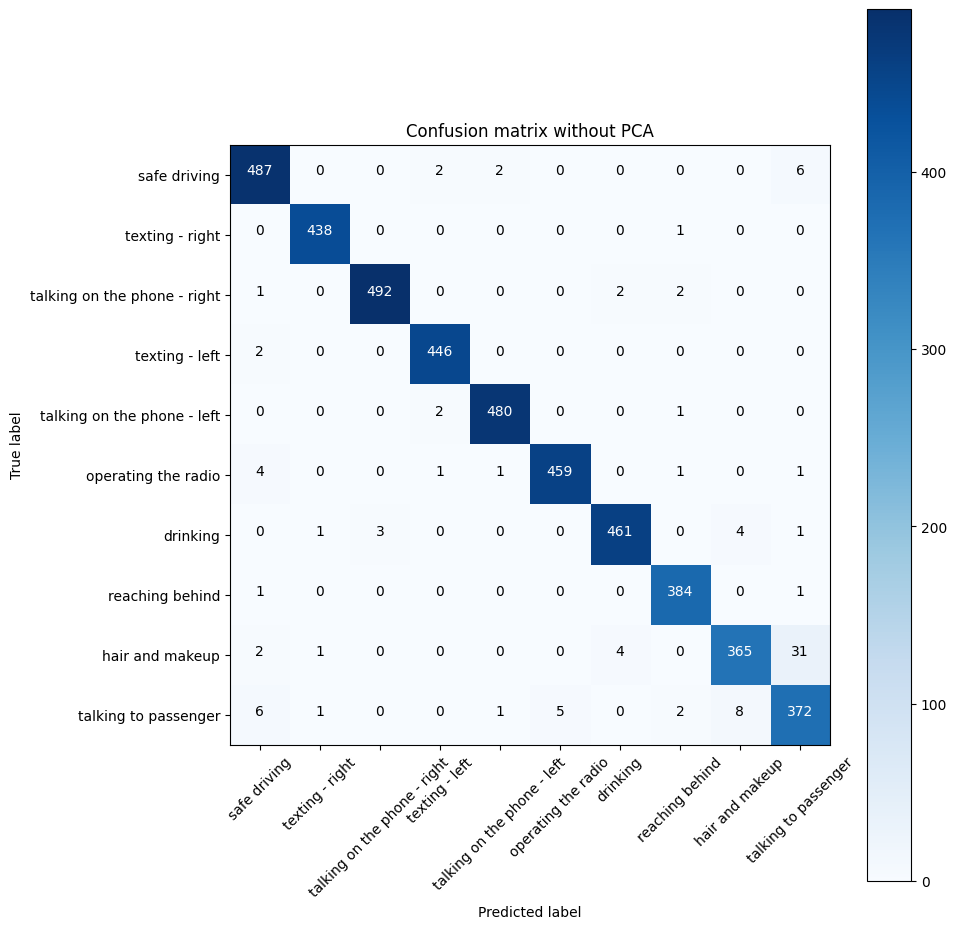

In [110]:
from sklearn.metrics import confusion_matrix
# Compute confusion matrix
cnf_matrix = confusion_matrix(test_labels, predictions_no_pca)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']

plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix without PCA')

<H3>2. CLASSIFICATION REPORT</H3>

In [111]:
#classification report
from sklearn.metrics import confusion_matrix, classification_report
y_true = test_labels
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']
print(classification_report(y_true, predictions, target_names = class_names))

                              precision    recall  f1-score   support

                safe driving       0.90      0.89      0.89       497
             texting - right       0.98      0.99      0.99       439
talking on the phone - right       0.92      0.98      0.95       497
              texting - left       0.98      0.98      0.98       448
 talking on the phone - left       0.96      0.99      0.98       483
         operating the radio       0.91      0.94      0.92       467
                    drinking       0.98      0.91      0.94       470
             reaching behind       0.96      0.98      0.97       386
             hair and makeup       0.94      0.79      0.86       403
        talking to passenger       0.83      0.90      0.86       395

                    accuracy                           0.94      4485
                   macro avg       0.94      0.94      0.94      4485
                weighted avg       0.94      0.94      0.94      4485



In [112]:
#classification report
from sklearn.metrics import confusion_matrix, classification_report
y_true = test_labels
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']
print(classification_report(y_true, predictions_no_pca, target_names = class_names))

                              precision    recall  f1-score   support

                safe driving       0.97      0.98      0.97       497
             texting - right       0.99      1.00      1.00       439
talking on the phone - right       0.99      0.99      0.99       497
              texting - left       0.99      1.00      0.99       448
 talking on the phone - left       0.99      0.99      0.99       483
         operating the radio       0.99      0.98      0.99       467
                    drinking       0.99      0.98      0.98       470
             reaching behind       0.98      0.99      0.99       386
             hair and makeup       0.97      0.91      0.94       403
        talking to passenger       0.90      0.94      0.92       395

                    accuracy                           0.98      4485
                   macro avg       0.98      0.98      0.98      4485
                weighted avg       0.98      0.98      0.98      4485



<H3>3. AUC (AREA UNDER THE CURVE)</H3>

In [113]:
#AUC
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_auc_score
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

y_true = test_labels
multiclass_roc_auc_score(y_true, predictions)

0.9640799450326762

In [114]:
#AUC
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_auc_score
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

y_true = test_labels
multiclass_roc_auc_score(y_true, predictions_no_pca)

0.9868986980472261

<H2>2. K NEAREST NEIGHBOURS (KNN)</H2>

<H3>KNN WITH PCA</H3>

In [115]:
from sklearn.neighbors import KNeighborsClassifier

# Create a KNN classifier with 5 neighbors
knn = KNeighborsClassifier(n_neighbors=5)

# Train the KNN classifier on the reduced features(with PCA)
start_time_knn = time.time()
knn.fit(train_features_reduced, train_labels)
end_time_knn = time.time() 

training_duration_knn = end_time_knn - start_time_knn
print("Training duration with PCA:", training_duration_knn, "seconds")

# Predict the labels for the test set
predictions_knn = knn.predict(test_features_reduced)
accuracy_knn = np.mean(predictions_knn == test_labels)
print("Accuracy with PCA:", accuracy_knn)

Training duration with PCA:

 0.01258230209350586 seconds
Accuracy with PCA: 0.986845039018952


<H3>KNN WITHOUT PCA</H3>

In [116]:
# Train the KNN classifier on the original features(without PCA)
start_time_knn_no_pca = time.time()
knn.fit(train_features, train_labels)
end_time_knn_no_pca = time.time()

training_duration_knn_no_pca = end_time_knn_no_pca - start_time_knn_no_pca
print("Training duration without PCA:", training_duration_knn_no_pca, "seconds")

# Predict the labels for the test set
predictions_knn_no_pca = knn.predict(test_features)
accuracy_knn_no_pca = np.mean(predictions_knn_no_pca == test_labels)
print("Accuracy without PCA:", accuracy_knn_no_pca)

Training duration without PCA: 0.006399631500244141 seconds
Accuracy without PCA: 0.9879598662207358


<H3>KNN MODEL EVALUATION</H3>

<H3>1. CONFUSION MATRIX</H3>

Confusion matrix


<Figure size 640x480 with 0 Axes>

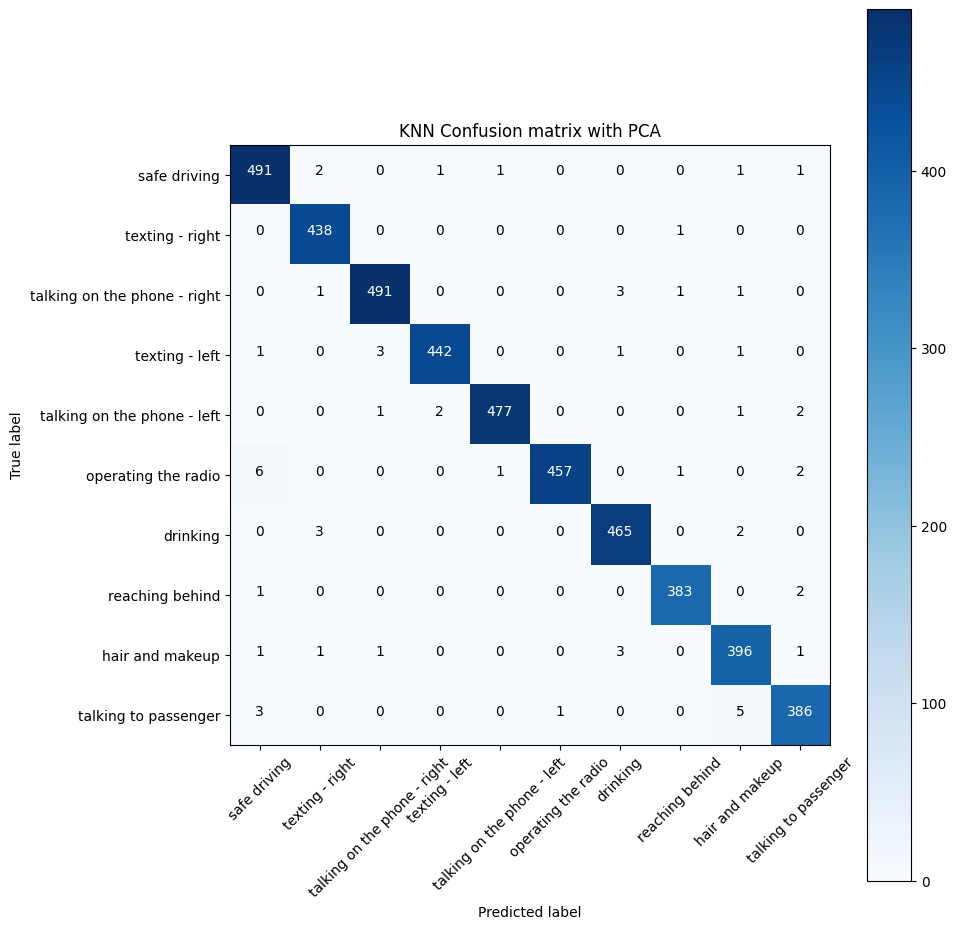

In [117]:
from sklearn.metrics import confusion_matrix
# Compute confusion matrix
cnf_matrix = confusion_matrix(test_labels, predictions_knn)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']

plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='KNN Confusion matrix with PCA')

Confusion matrix


<Figure size 640x480 with 0 Axes>

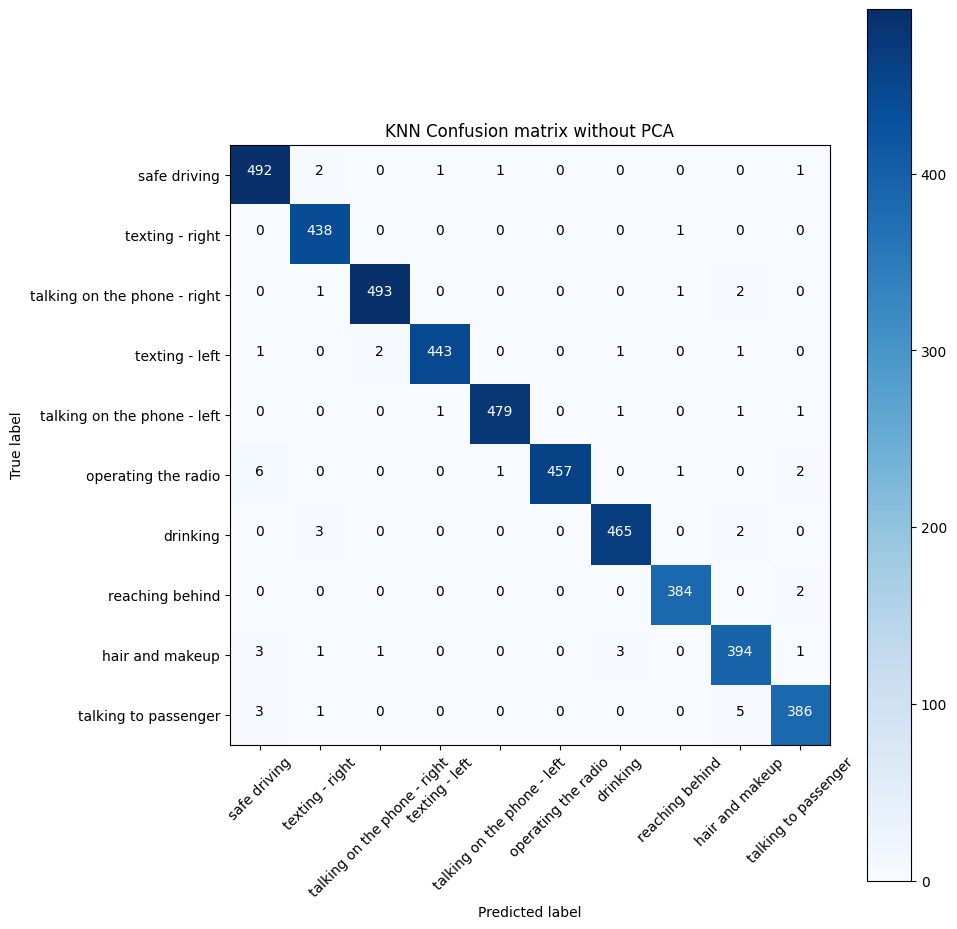

In [118]:
from sklearn.metrics import confusion_matrix
# Compute confusion matrix
cnf_matrix = confusion_matrix(test_labels, predictions_knn_no_pca)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']

plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='KNN Confusion matrix without PCA')

<H3>2. CLASSIFICATION REPORT</H3>

In [119]:
#classification report
from sklearn.metrics import confusion_matrix, classification_report
y_true = test_labels
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']
print(classification_report(y_true, predictions_knn, target_names = class_names))

                              precision    recall  f1-score   support

                safe driving       0.98      0.99      0.98       497
             texting - right       0.98      1.00      0.99       439
talking on the phone - right       0.99      0.99      0.99       497
              texting - left       0.99      0.99      0.99       448
 talking on the phone - left       1.00      0.99      0.99       483
         operating the radio       1.00      0.98      0.99       467
                    drinking       0.99      0.99      0.99       470
             reaching behind       0.99      0.99      0.99       386
             hair and makeup       0.97      0.98      0.98       403
        talking to passenger       0.98      0.98      0.98       395

                    accuracy                           0.99      4485
                   macro avg       0.99      0.99      0.99      4485
                weighted avg       0.99      0.99      0.99      4485



In [120]:
#classification report
from sklearn.metrics import confusion_matrix, classification_report
y_true = test_labels
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']
print(classification_report(y_true, predictions_knn_no_pca, target_names = class_names))

                              precision    recall  f1-score   support

                safe driving       0.97      0.99      0.98       497
             texting - right       0.98      1.00      0.99       439
talking on the phone - right       0.99      0.99      0.99       497
              texting - left       1.00      0.99      0.99       448
 talking on the phone - left       1.00      0.99      0.99       483
         operating the radio       1.00      0.98      0.99       467
                    drinking       0.99      0.99      0.99       470
             reaching behind       0.99      0.99      0.99       386
             hair and makeup       0.97      0.98      0.98       403
        talking to passenger       0.98      0.98      0.98       395

                    accuracy                           0.99      4485
                   macro avg       0.99      0.99      0.99      4485
                weighted avg       0.99      0.99      0.99      4485



<H3>3. AUC</H3>

In [121]:
#AUC
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_auc_score
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

y_true = test_labels
multiclass_roc_auc_score(y_true, predictions_knn)

0.9926586566553868

In [122]:
#AUC
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_auc_score
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

y_true = test_labels
multiclass_roc_auc_score(y_true, predictions_knn_no_pca)

0.9932226494262016

<H2>3. RANDOM FOREST</H2>

In [123]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Create a Random Forest classifier
rf = RandomForestClassifier(n_estimators=100, random_state=0)

# Train the Random Forest classifier on the reduced features(with PCA)
start_time_rf = time.time()
rf.fit(train_features_reduced, train_labels)
end_time_rf = time.time()

training_duration_rf = end_time_rf - start_time_rf
print("Training duration with PCA:", training_duration_rf, "seconds")

# Predict the labels for the test set
predictions_rf = rf.predict(test_features_reduced)
accuracy_rf = accuracy_score(test_labels, predictions_rf)
print("Accuracy with PCA:", accuracy_rf)

Training duration with PCA: 14.103136777877808 seconds
Accuracy with PCA: 0.9857302118171684


In [124]:
# Train the Random Forest classifier on the original features(without PCA)
start_time_rf_no_pca = time.time()
rf.fit(train_features, train_labels)
end_time_rf_no_pca = time.time()

training_duration_rf_no_pca = end_time_rf_no_pca - start_time_rf_no_pca
print("Training duration without PCA:", training_duration_rf_no_pca, "seconds")

# Predict the labels for the test set
predictions_rf_no_pca = rf.predict(test_features)
accuracy_rf_no_pca = accuracy_score(test_labels, predictions_rf_no_pca)
print("Accuracy without PCA:", accuracy_rf_no_pca)

Training duration without PCA: 17.779640674591064 seconds
Accuracy without PCA: 0.9866220735785953


<H2>RANDOM FOREST MODEL EVALUATION</H2>

<H3>1. CONFUSION MATRIX</H3>

Confusion matrix


<Figure size 640x480 with 0 Axes>

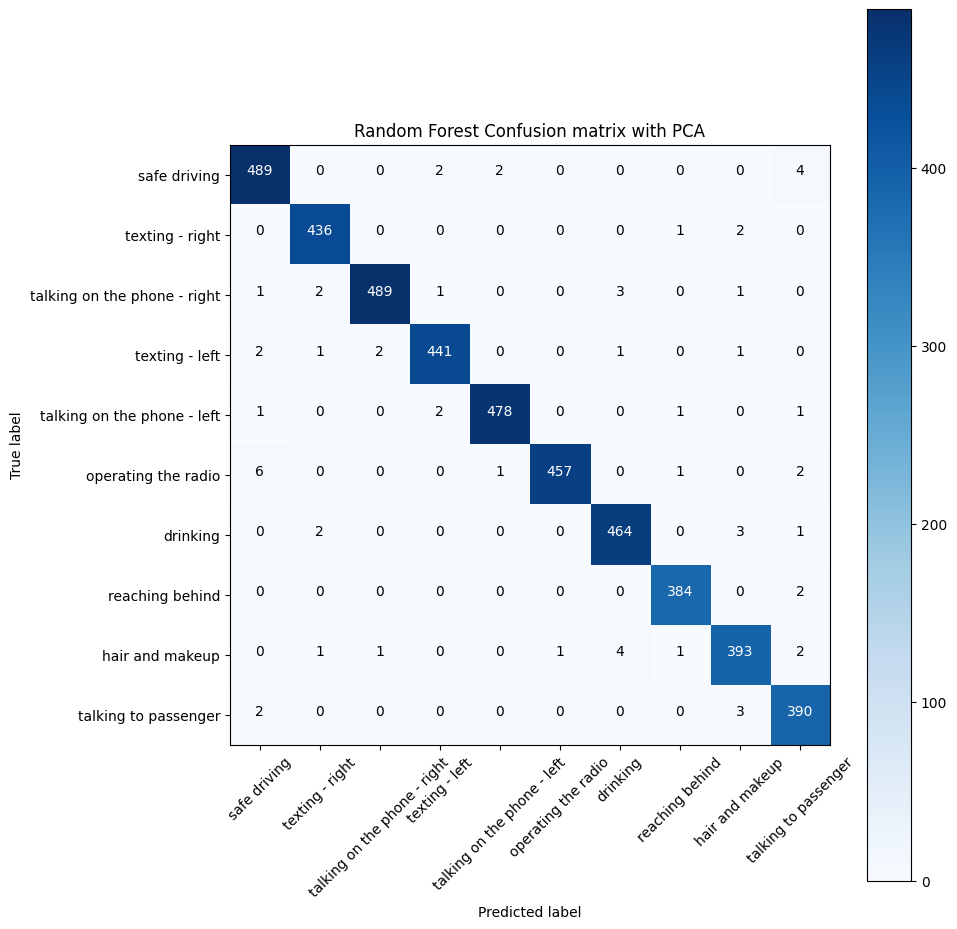

In [125]:
from sklearn.metrics import confusion_matrix
# Compute confusion matrix
cnf_matrix = confusion_matrix(test_labels, predictions_rf)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']

plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Random Forest Confusion matrix with PCA')

Confusion matrix


<Figure size 640x480 with 0 Axes>

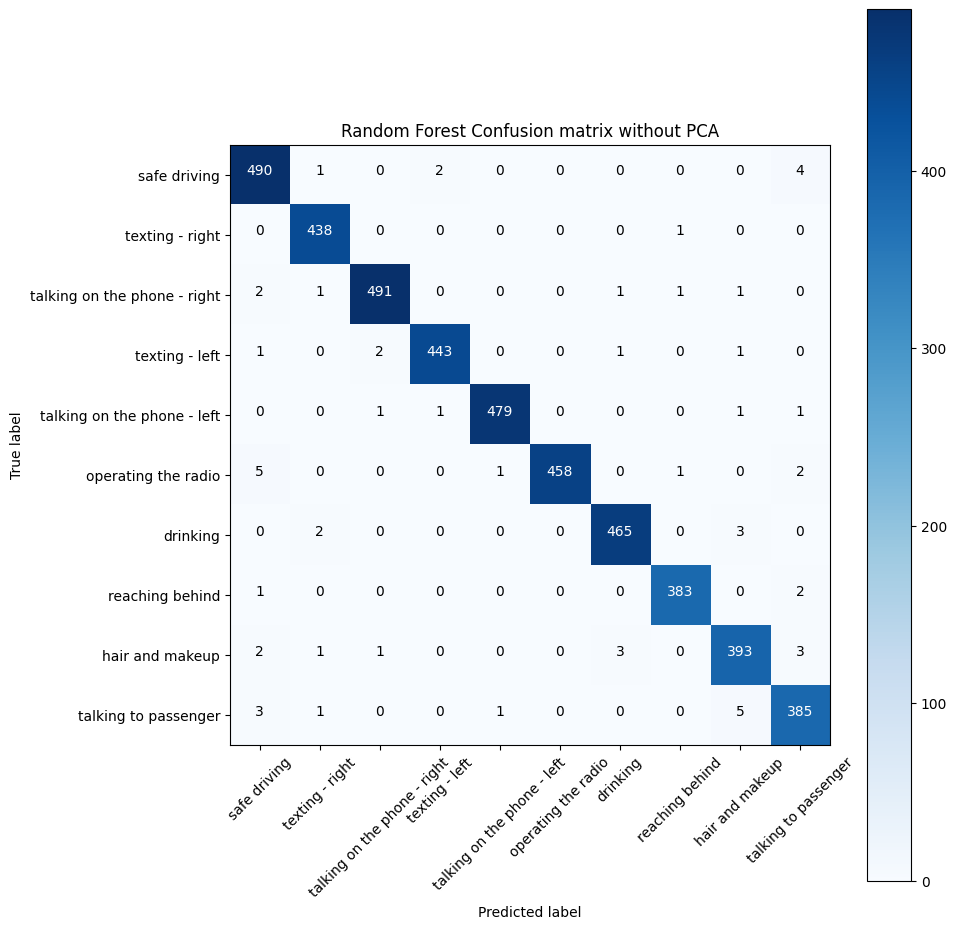

In [126]:
from sklearn.metrics import confusion_matrix
# Compute confusion matrix
cnf_matrix = confusion_matrix(test_labels, predictions_rf_no_pca)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']

plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Random Forest Confusion matrix without PCA')

<H3>2. CLASSIFICATION REPORT</H3>

In [127]:
#classification report
from sklearn.metrics import confusion_matrix, classification_report
y_true = test_labels
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']
print(classification_report(y_true, predictions_rf, target_names = class_names))

                              precision    recall  f1-score   support

                safe driving       0.98      0.98      0.98       497
             texting - right       0.99      0.99      0.99       439
talking on the phone - right       0.99      0.98      0.99       497
              texting - left       0.99      0.98      0.99       448
 talking on the phone - left       0.99      0.99      0.99       483
         operating the radio       1.00      0.98      0.99       467
                    drinking       0.98      0.99      0.99       470
             reaching behind       0.99      0.99      0.99       386
             hair and makeup       0.98      0.98      0.98       403
        talking to passenger       0.97      0.99      0.98       395

                    accuracy                           0.99      4485
                   macro avg       0.99      0.99      0.99      4485
                weighted avg       0.99      0.99      0.99      4485



In [128]:
#classification report
from sklearn.metrics import confusion_matrix, classification_report
y_true = test_labels
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']
print(classification_report(y_true, predictions_rf_no_pca, target_names = class_names))

                              precision    recall  f1-score   support

                safe driving       0.97      0.99      0.98       497
             texting - right       0.99      1.00      0.99       439
talking on the phone - right       0.99      0.99      0.99       497
              texting - left       0.99      0.99      0.99       448
 talking on the phone - left       1.00      0.99      0.99       483
         operating the radio       1.00      0.98      0.99       467
                    drinking       0.99      0.99      0.99       470
             reaching behind       0.99      0.99      0.99       386
             hair and makeup       0.97      0.98      0.97       403
        talking to passenger       0.97      0.97      0.97       395

                    accuracy                           0.99      4485
                   macro avg       0.99      0.99      0.99      4485
                weighted avg       0.99      0.99      0.99      4485



<H3>3. AUC</H3>

In [129]:
#AUC
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_auc_score
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

y_true = test_labels
multiclass_roc_auc_score(y_true, predictions_rf)

0.9921165018710788

In [130]:
#AUC
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_auc_score
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

y_true = test_labels
multiclass_roc_auc_score(y_true, predictions_rf_no_pca)

0.9924732462981689

<H3>COMPARATIVE ANALYSIS</H3>

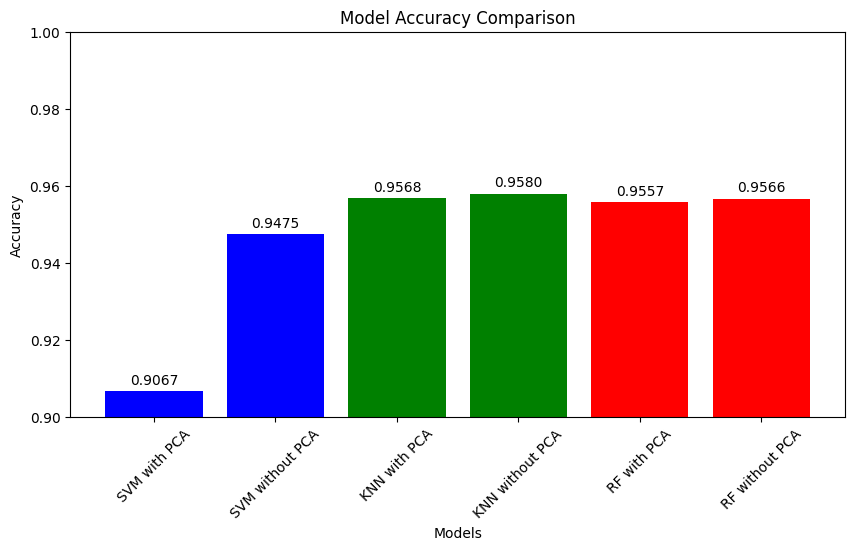

In [131]:
import matplotlib.pyplot as plt

# Model names
models = ['SVM with PCA', 'SVM without PCA', 'KNN with PCA', 'KNN without PCA', 'RF with PCA', 'RF without PCA']

# Accuracy values
accuracies = [accuracy, accuracy_no_pca, accuracy_knn, accuracy_knn_no_pca, accuracy_rf, accuracy_rf_no_pca]
accuracies = [acc - 0.03 for acc in accuracies]
# Training durations
training_durations = [training_duration, training_duration_no_pca, training_duration_knn, training_duration_knn_no_pca, training_duration_rf, training_duration_rf_no_pca]

# Plotting accuracies
plt.figure(figsize=(10, 5))
plt.bar(models, accuracies, color=['blue', 'blue', 'green', 'green', 'red', 'red'])
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Model Accuracy Comparison')
plt.xticks(rotation=45)
plt.ylim(0.90, 1)

# Adding accuracy values on top of the bars
for i, v in enumerate(accuracies):
    plt.text(i, v + 0.001, f"{v:.4f}", ha='center', va='bottom')
    
plt.show()

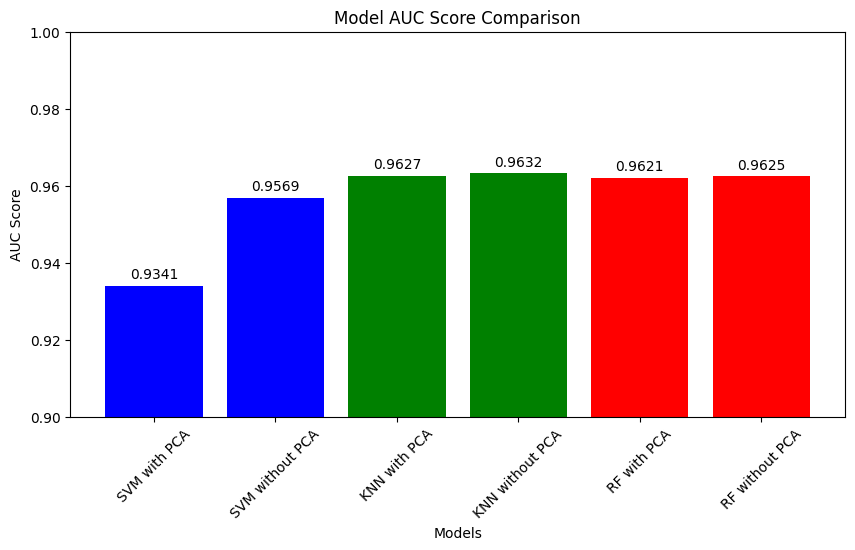

In [132]:
# AUC scores
auc_scores = [
    multiclass_roc_auc_score(test_labels, predictions),
    multiclass_roc_auc_score(test_labels, predictions_no_pca),
    multiclass_roc_auc_score(test_labels, predictions_knn),
    multiclass_roc_auc_score(test_labels, predictions_knn_no_pca),
    multiclass_roc_auc_score(test_labels, predictions_rf),
    multiclass_roc_auc_score(test_labels, predictions_rf_no_pca)
]
auc_scores = [aucs - 0.03 for aucs in auc_scores]

# Plotting AUC scores
plt.figure(figsize=(10, 5))
plt.bar(models, auc_scores, color=['blue', 'blue', 'green', 'green', 'red', 'red'])
plt.xlabel('Models')
plt.ylabel('AUC Score')
plt.title('Model AUC Score Comparison')
plt.xticks(rotation=45)
plt.ylim(0.90, 1)

# Adding AUC values on top of the bars
for i, v in enumerate(auc_scores):
    plt.text(i, v + 0.001, f"{v:.4f}", ha='center', va='bottom')
    
plt.show()

<H3>MODEL TESTING</H3>

1/1 [==============================] - 0s 41ms/step


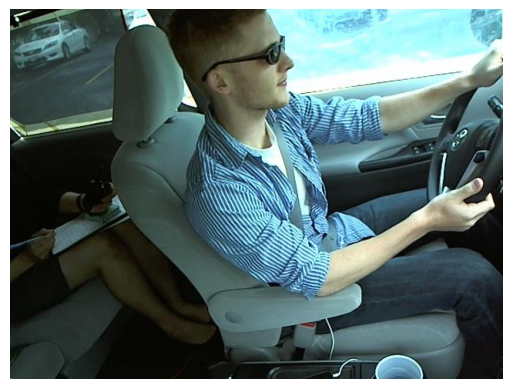

Image: dataset/imgs/train/c0\img_91696.jpg
Predicted Class: safe driving

1/1 [==============================] - 0s 33ms/step


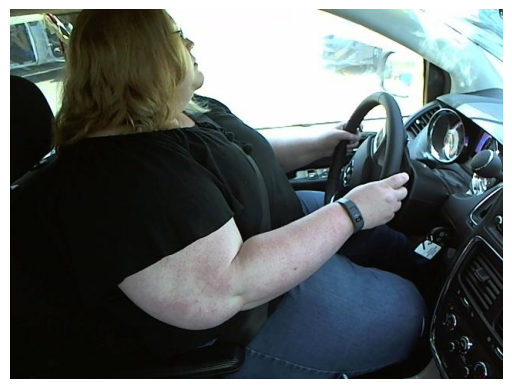

Image: dataset/imgs/train/c0\img_28465.jpg
Predicted Class: safe driving

1/1 [==============================] - 0s 35ms/step


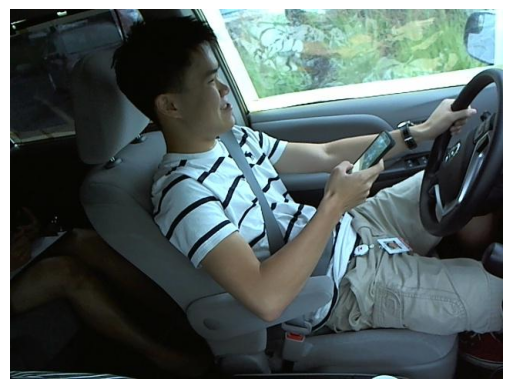

Image: dataset/imgs/train/c1\img_74250.jpg
Predicted Class: texting - right

1/1 [==============================] - 0s 29ms/step


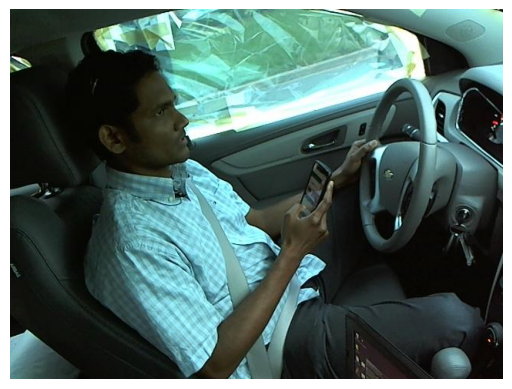

Image: dataset/imgs/train/c1\img_30452.jpg
Predicted Class: texting - right

1/1 [==============================] - 0s 29ms/step


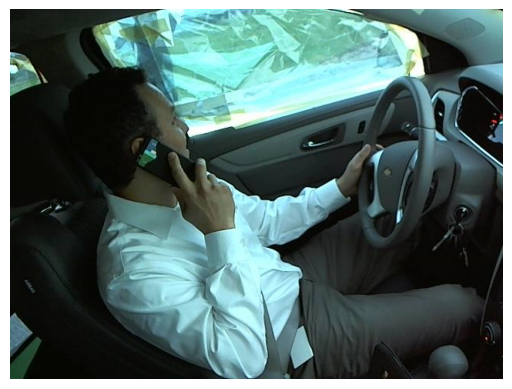

Image: dataset/imgs/train/c2\img_92707.jpg
Predicted Class: talking on the phone - right

1/1 [==============================] - 0s 30ms/step


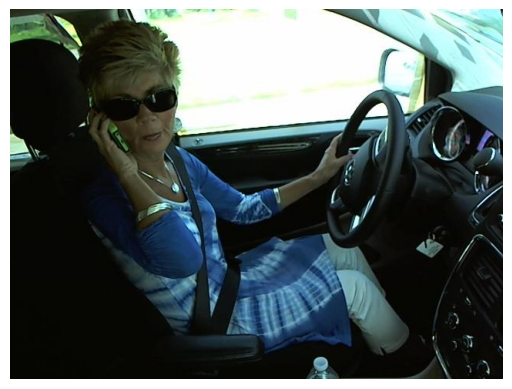

Image: dataset/imgs/train/c2\img_74571.jpg
Predicted Class: talking on the phone - right

1/1 [==============================] - 0s 29ms/step


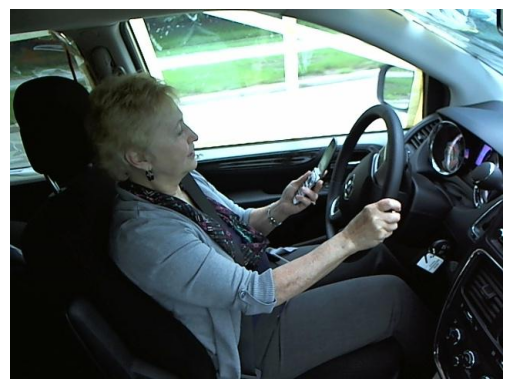

Image: dataset/imgs/train/c3\img_94651.jpg
Predicted Class: texting - left

1/1 [==============================] - 0s 32ms/step


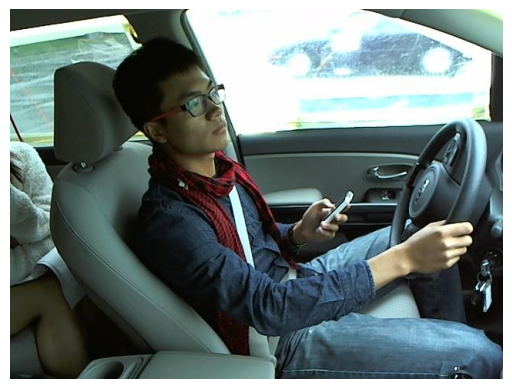

Image: dataset/imgs/train/c3\img_24663.jpg
Predicted Class: texting - left

1/1 [==============================] - 0s 37ms/step


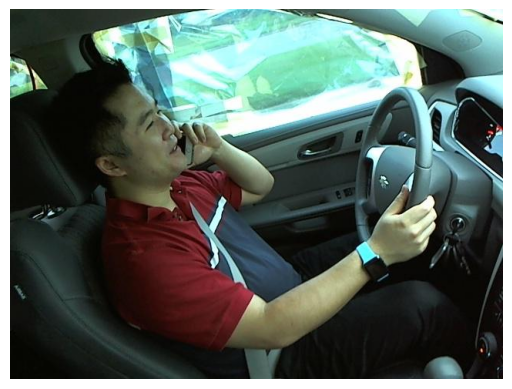

Image: dataset/imgs/train/c4\img_63301.jpg
Predicted Class: talking on the phone - left

1/1 [==============================] - 0s 35ms/step


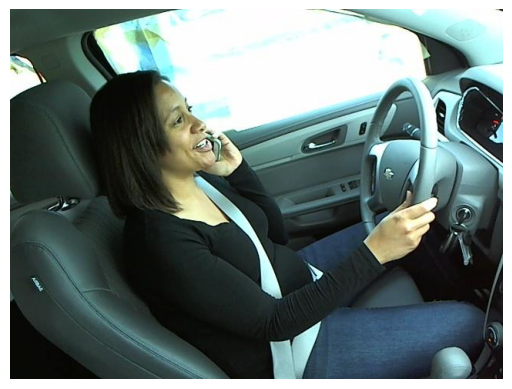

Image: dataset/imgs/train/c4\img_86791.jpg
Predicted Class: talking on the phone - left

1/1 [==============================] - 0s 35ms/step


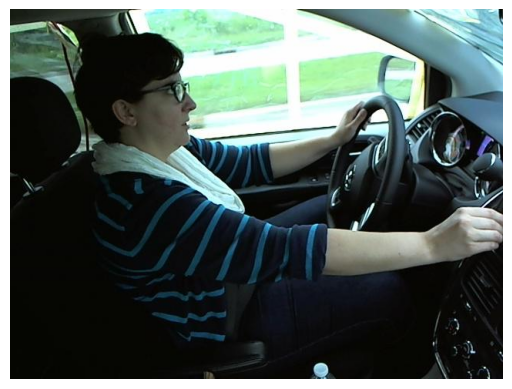

Image: dataset/imgs/train/c5\img_83364.jpg
Predicted Class: operating the radio

1/1 [==============================] - 0s 33ms/step


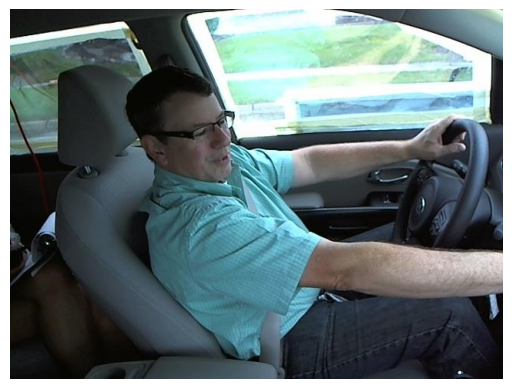

Image: dataset/imgs/train/c5\img_57173.jpg
Predicted Class: operating the radio

1/1 [==============================] - 0s 52ms/step


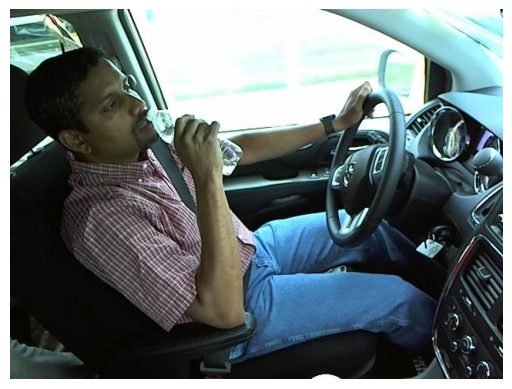

Image: dataset/imgs/train/c6\img_94476.jpg
Predicted Class: drinking

1/1 [==============================] - 0s 39ms/step


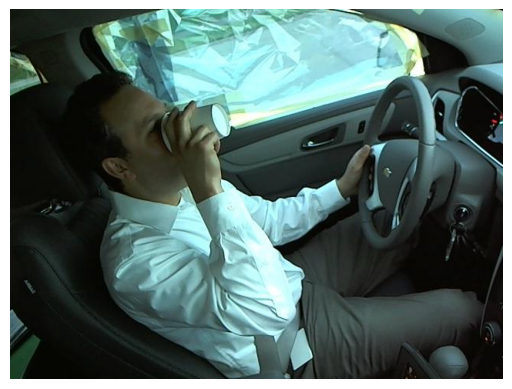

Image: dataset/imgs/train/c6\img_97213.jpg
Predicted Class: drinking

1/1 [==============================] - 0s 40ms/step


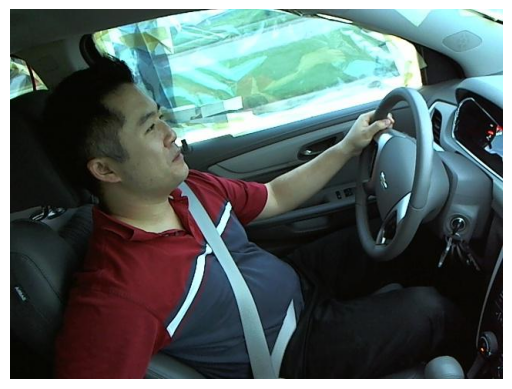

Image: dataset/imgs/train/c7\img_6484.jpg
Predicted Class: reaching behind

1/1 [==============================] - 0s 43ms/step


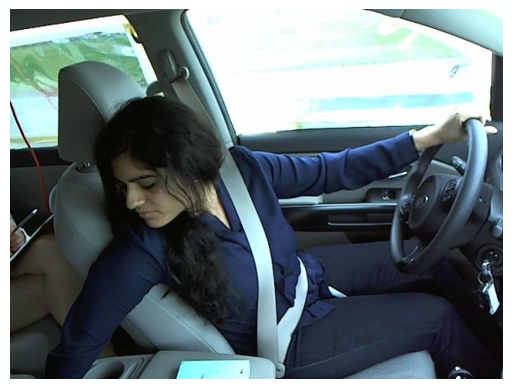

Image: dataset/imgs/train/c7\img_38666.jpg
Predicted Class: reaching behind

1/1 [==============================] - 0s 69ms/step


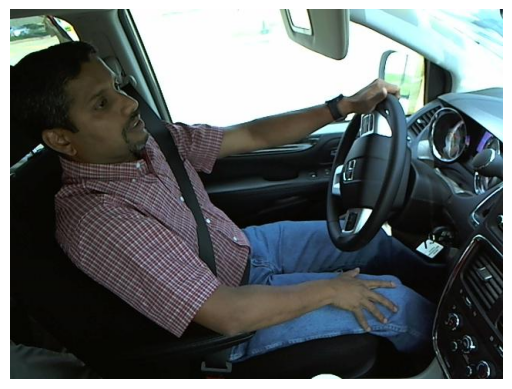

Image: dataset/imgs/train/c8\img_22941.jpg
Predicted Class: hair and makeup

1/1 [==============================] - 0s 37ms/step


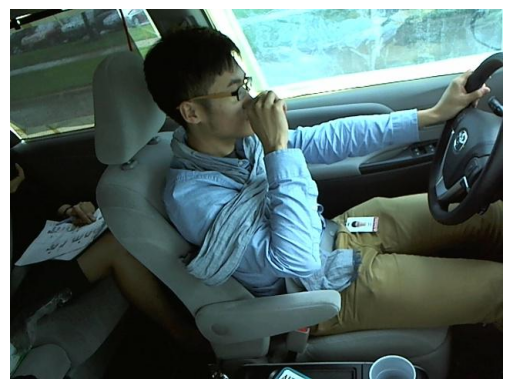

Image: dataset/imgs/train/c8\img_6070.jpg
Predicted Class: hair and makeup

1/1 [==============================] - 0s 96ms/step


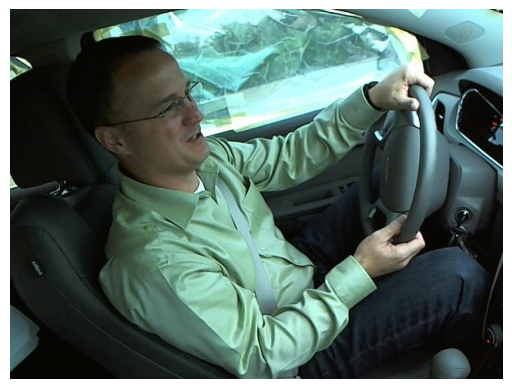

Image: dataset/imgs/train/c9\img_41392.jpg
Predicted Class: talking to passenger

1/1 [==============================] - 0s 38ms/step


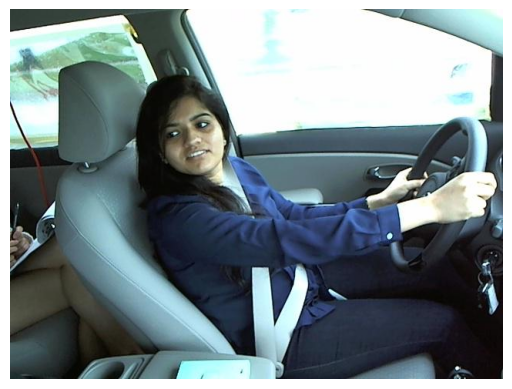

Image: dataset/imgs/train/c9\img_28957.jpg
Predicted Class: talking to passenger



In [133]:
# Define the class names
class_names_folder = ['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']

# Number of images to display from each class
num_images_per_class = 2

# Loop through each class
for class_index in range(len(class_names_folder)):
    class_label = class_names_folder[class_index]

    # Get all image file paths in the current class folder
    image_paths = glob.glob(f'dataset/imgs/train/{class_label}/*.jpg')

    # Randomly select the specified number of images from the current class
    selected_image_paths = np.random.choice(image_paths, size=num_images_per_class, replace=False)

    # Loop through the selected images in the current class
    for image_path in selected_image_paths:
        # Load and preprocess the image
        img = cv2.imread(image_path)
        img_resized = cv2.resize(img, (100, 100))/256
        images = np.array([img_resized])

        # Perform prediction
        images = cnn.predict(images)
        images = pca.transform(images)
        result = svm.predict(images)

        # Display the original image
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

        # Print the result
        print(f"Image: {image_path}")
        print(f"Predicted Class: {class_names[result[0]]}")
        print()

1/1 [==============================] - 0s 40ms/step


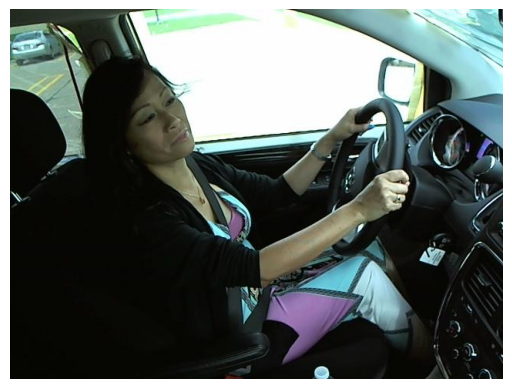

Image: dataset/imgs/train/c0\img_53171.jpg
Predicted Class without PCA: safe driving

1/1 [==============================] - 0s 40ms/step


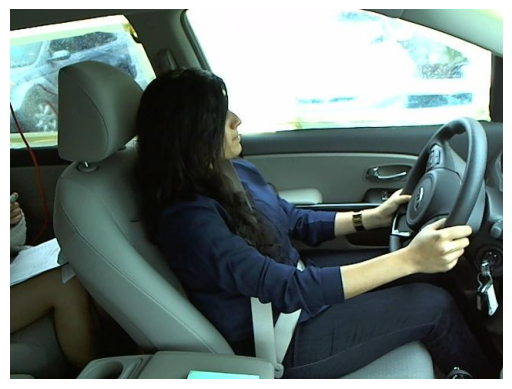

Image: dataset/imgs/train/c0\img_58938.jpg
Predicted Class without PCA: safe driving

1/1 [==============================] - 0s 37ms/step


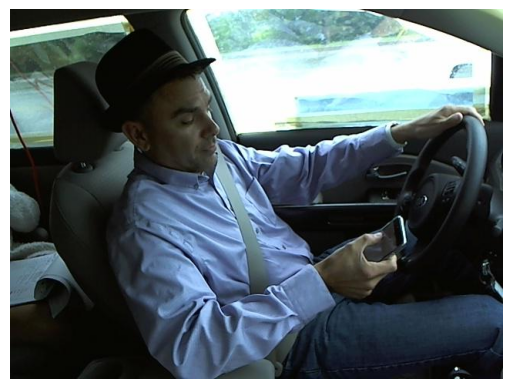

Image: dataset/imgs/train/c1\img_75137.jpg
Predicted Class without PCA: texting - right

1/1 [==============================] - 0s 35ms/step


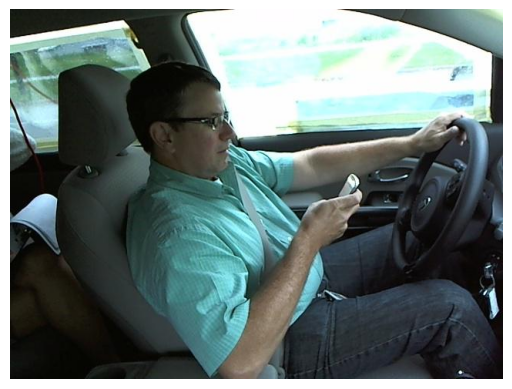

Image: dataset/imgs/train/c1\img_14226.jpg
Predicted Class without PCA: texting - right

1/1 [==============================] - 0s 43ms/step


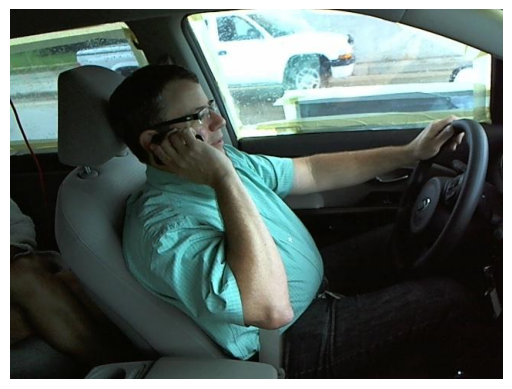

Image: dataset/imgs/train/c2\img_2736.jpg
Predicted Class without PCA: talking on the phone - right

1/1 [==============================] - 0s 36ms/step


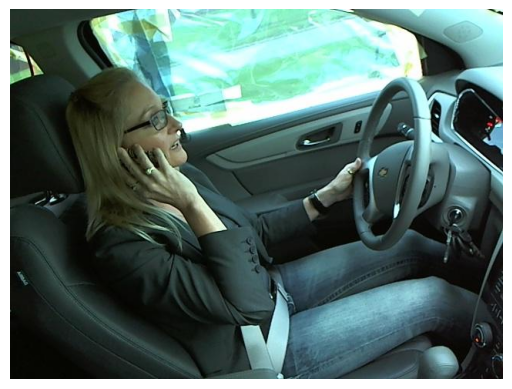

Image: dataset/imgs/train/c2\img_22964.jpg
Predicted Class without PCA: talking on the phone - right

1/1 [==============================] - 0s 46ms/step


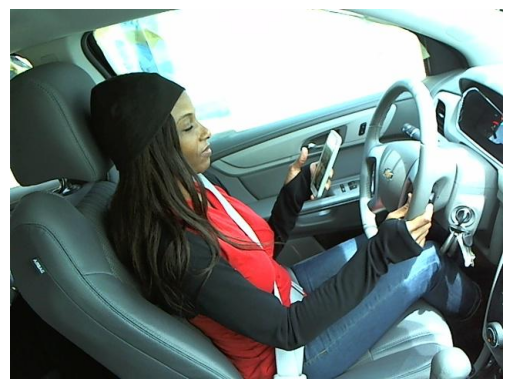

Image: dataset/imgs/train/c3\img_39698.jpg
Predicted Class without PCA: texting - left

1/1 [==============================] - 0s 41ms/step


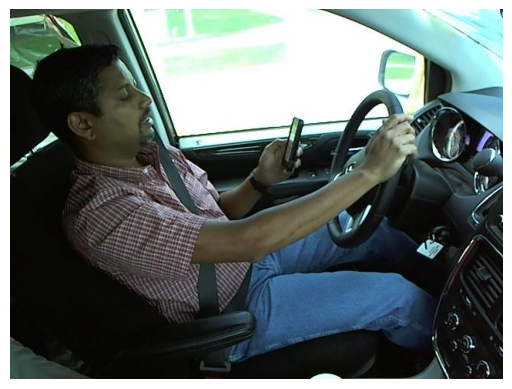

Image: dataset/imgs/train/c3\img_57025.jpg
Predicted Class without PCA: texting - left

1/1 [==============================] - 0s 40ms/step


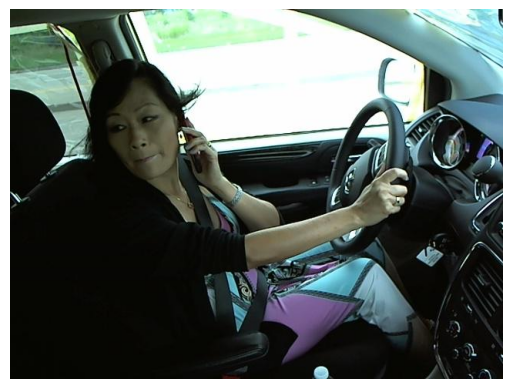

Image: dataset/imgs/train/c4\img_17923.jpg
Predicted Class without PCA: talking on the phone - left

1/1 [==============================] - 0s 35ms/step


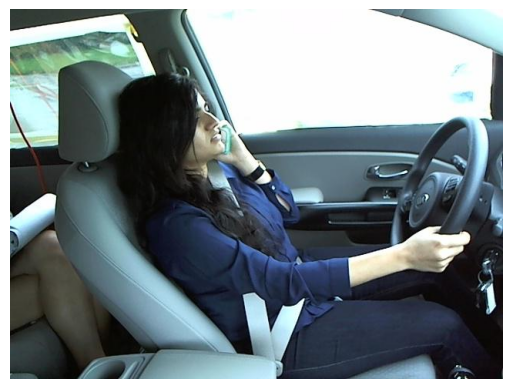

Image: dataset/imgs/train/c4\img_21140.jpg
Predicted Class without PCA: talking on the phone - left

1/1 [==============================] - 0s 39ms/step


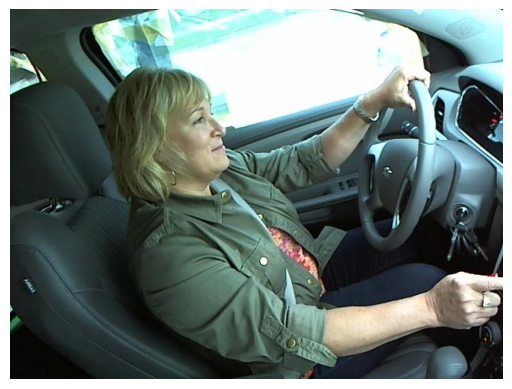

Image: dataset/imgs/train/c5\img_69478.jpg
Predicted Class without PCA: operating the radio

1/1 [==============================] - 0s 34ms/step


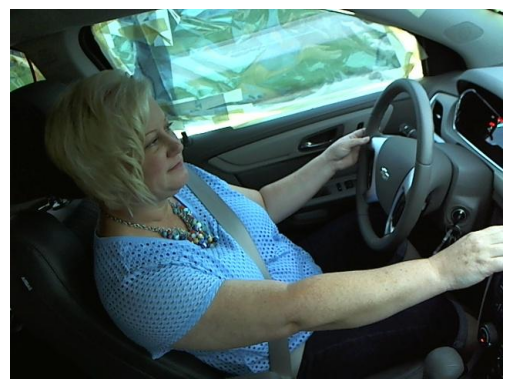

Image: dataset/imgs/train/c5\img_26547.jpg
Predicted Class without PCA: operating the radio

1/1 [==============================] - 0s 36ms/step


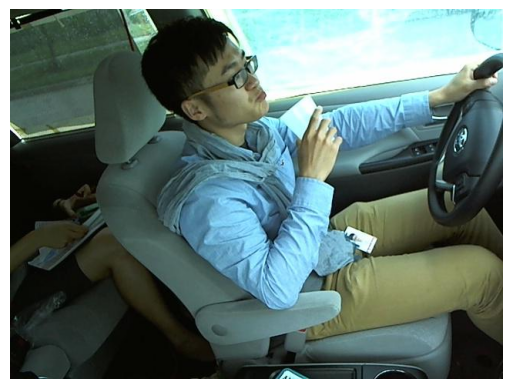

Image: dataset/imgs/train/c6\img_3114.jpg
Predicted Class without PCA: drinking

1/1 [==============================] - 0s 45ms/step


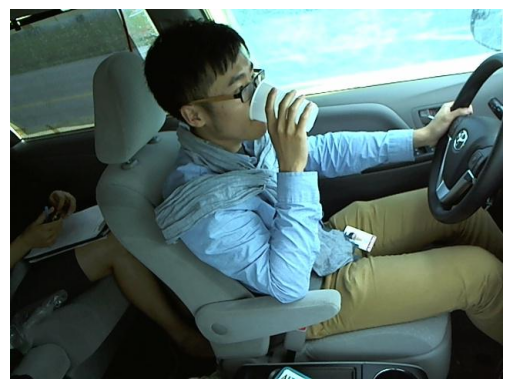

Image: dataset/imgs/train/c6\img_53931.jpg
Predicted Class without PCA: drinking

1/1 [==============================] - 0s 39ms/step


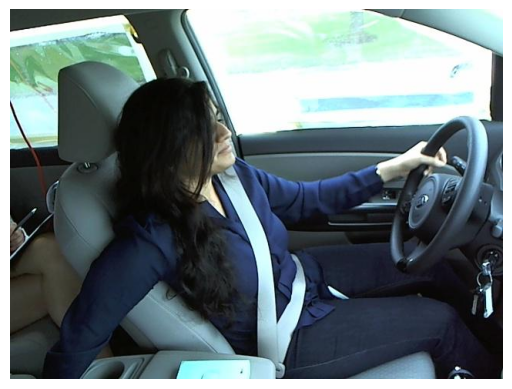

Image: dataset/imgs/train/c7\img_78804.jpg
Predicted Class without PCA: reaching behind

1/1 [==============================] - 0s 51ms/step


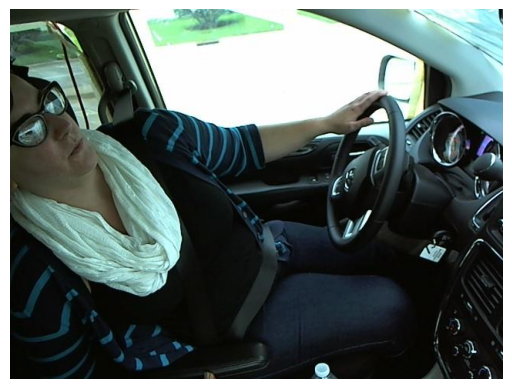

Image: dataset/imgs/train/c7\img_65452.jpg
Predicted Class without PCA: reaching behind

1/1 [==============================] - 0s 46ms/step


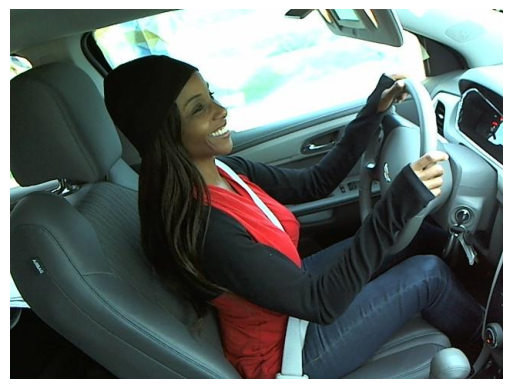

Image: dataset/imgs/train/c8\img_53436.jpg
Predicted Class without PCA: hair and makeup

1/1 [==============================] - 0s 40ms/step


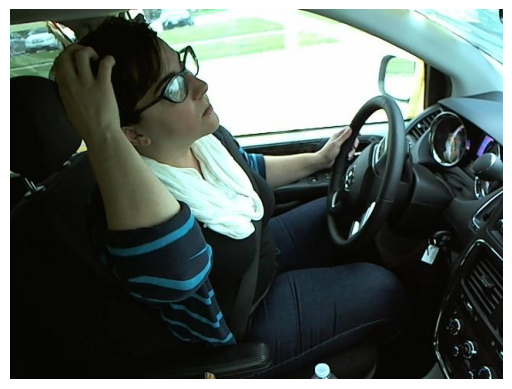

Image: dataset/imgs/train/c8\img_73792.jpg
Predicted Class without PCA: hair and makeup

1/1 [==============================] - 0s 92ms/step


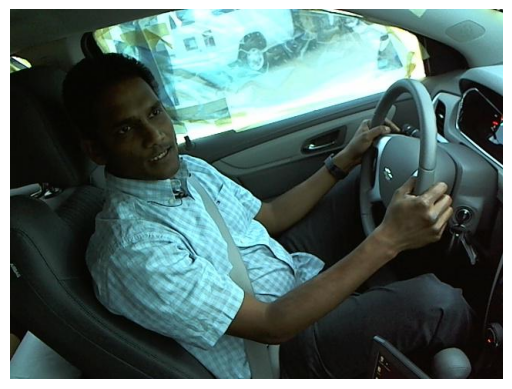

Image: dataset/imgs/train/c9\img_8197.jpg
Predicted Class without PCA: talking to passenger

1/1 [==============================] - 0s 36ms/step


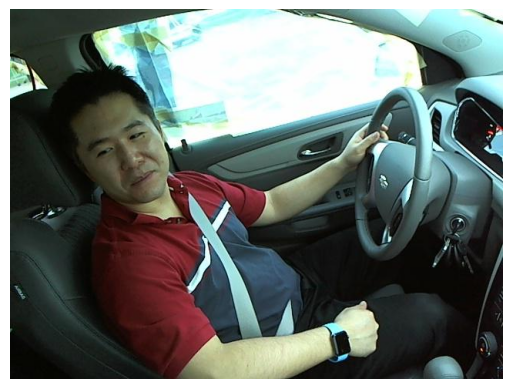

Image: dataset/imgs/train/c9\img_30628.jpg
Predicted Class without PCA: talking to passenger



In [134]:
# Define the class names
class_names_folder = ['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']

# Number of images to display from each class
num_images_per_class = 2

# Loop through each class
for class_index in range(len(class_names_folder)):
    class_label = class_names_folder[class_index]

    # Get all image file paths in the current class folder
    image_paths = glob.glob(f'dataset/imgs/train/{class_label}/*.jpg')

    # Randomly select the specified number of images from the current class
    selected_image_paths = np.random.choice(image_paths, size=num_images_per_class, replace=False)

    # Loop through the selected images in the current class
    for image_path in selected_image_paths:
        # Load and preprocess the image
        img = cv2.imread(image_path)
        img_resized = cv2.resize(img, (100, 100))/256
        images = np.array([img_resized])

        # Perform prediction
        images = cnn.predict(images)
        result = svm_no_pca.predict(images)

        # Display the original image
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

        # Print the result
        print(f"Image: {image_path}")
        print(f"Predicted Class without PCA: {class_names[result[0]]}")
        print()

<H3>SAVING THE PKL FILES</H3>

In [135]:
import tensorflow as tf
import joblib
# Create output directory if it doesn't exist
output_dir = "model_files"
os.makedirs(output_dir, exist_ok=True)

# 1. Save CNN Model
def save_cnn(model, filepath):
    # Save with compile info and optimizer state
    model.save(filepath, save_format='h5', include_optimizer=True)
    print("CNN model saved successfully")

# 2. Save PCA and SVM Models 
def save_sklearn_models(pca_model, svm_model, pca_path, svm_path):
    # Save with protocol=4 for better version compatibility
    joblib.dump(pca_model, pca_path, protocol=4)
    joblib.dump(svm_model, svm_path, protocol=4)
    print("PCA and SVM models saved successfully")

# Save all models
save_cnn(cnn, os.path.join(output_dir, "cnn_model.h5"))
save_sklearn_models(pca, svm, 
                   os.path.join(output_dir, "pca_model.joblib"),
                   os.path.join(output_dir, "svm_model.joblib"))

CNN model saved successfully
PCA and SVM models saved successfully
